In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter
from pathlib import Path
from random import choice
from sklearn.cluster import KMeans
from collections import Counter
%matplotlib inline

In [3]:
required_extensions = ["*.jpg", "*.jpeg", "*.png", "*.gif", "*.webp"]
images = []
for paths in [Path('docs/images').rglob(ext) for ext in required_extensions]:
    for path in paths:
        images.append(path.relative_to('.'))

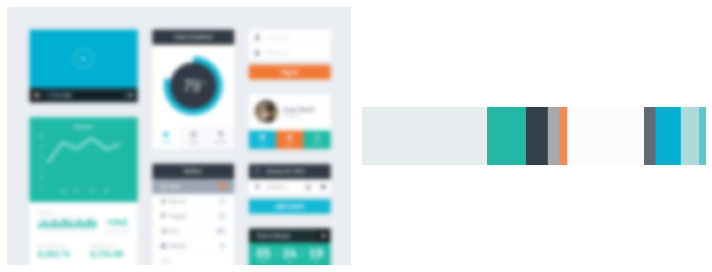

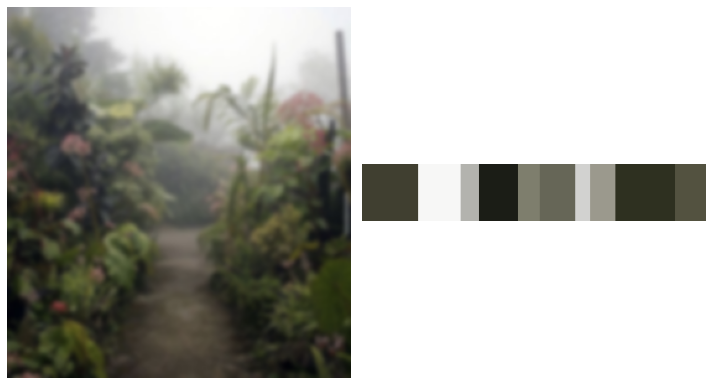

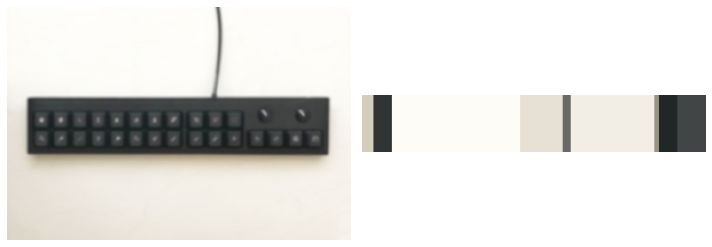

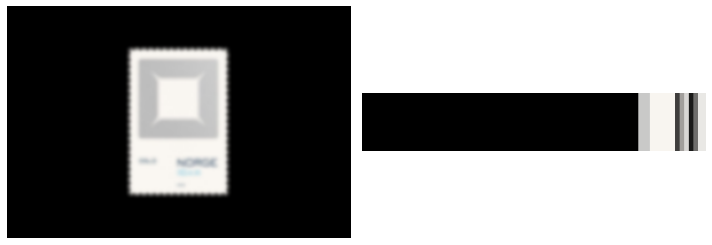

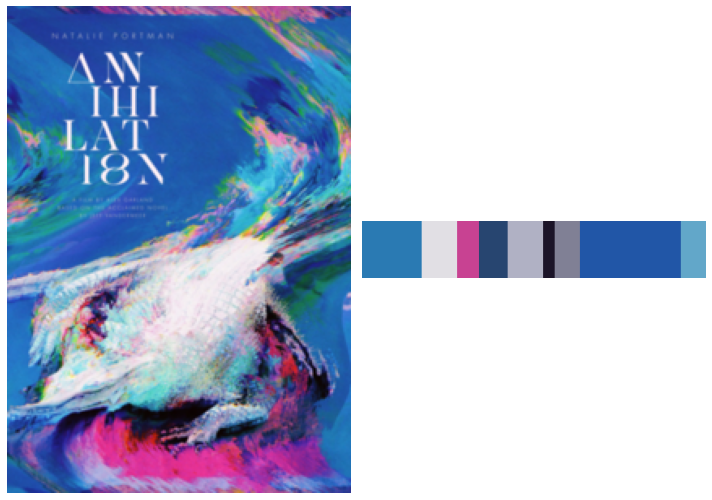

...

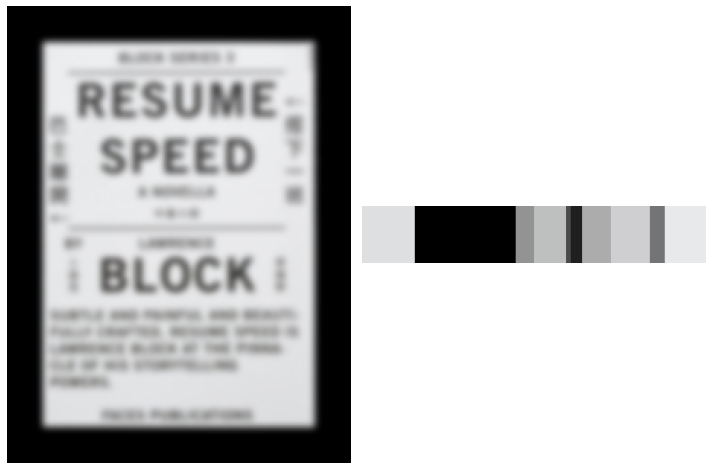

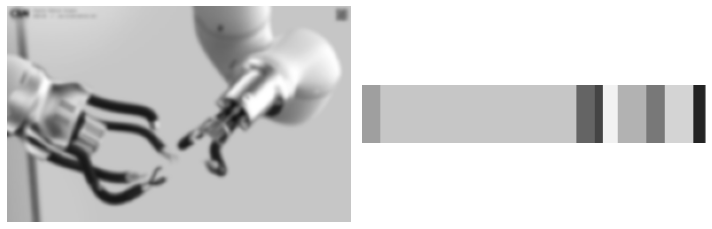

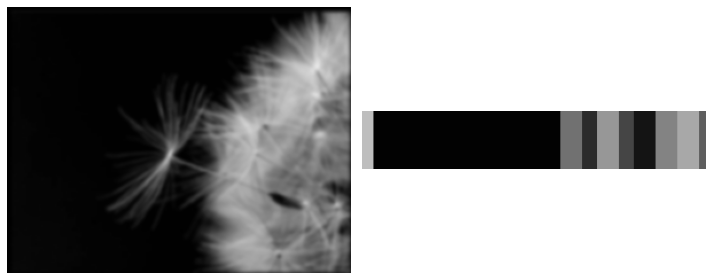

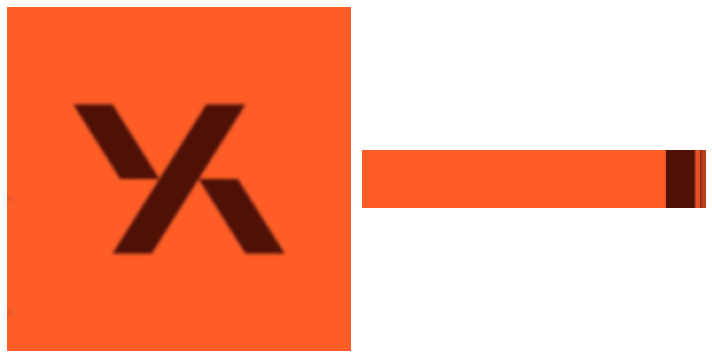

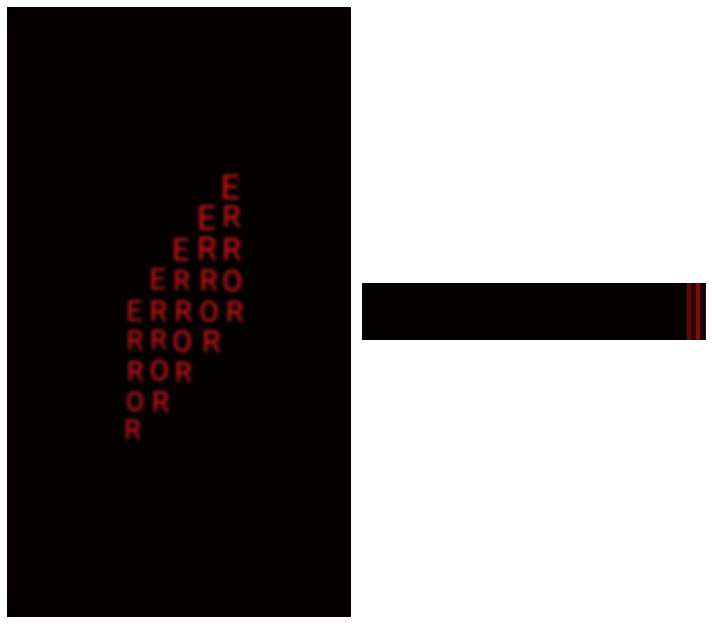

KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_fast._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt: 


In [4]:

# plt.imshow(img)
def palette_perc(img_2, n_clusters=3):
    k_cluster = KMeans(n_clusters)
    k_cluster.fit(img_2.reshape(-1, 3))
    width = 300
    palette = np.zeros((50, width, 3), np.uint8)
    
    n_pixels = len(k_cluster.labels_)
    counter = Counter(k_cluster.labels_) # count how many pixels per cluster
    perc = {}
    for i in counter:
        perc[i] = np.round(counter[i]/n_pixels, 2)
    perc = dict(sorted(perc.items()))

    step = 0
    
    for idx, centers in enumerate(k_cluster.cluster_centers_): 
        palette[:, step:int(step + perc[idx]*width+1), :] = centers
        step += int(perc[idx]*width+1)
        
    return palette

def show_img_compar(img_1, img_2 ):
    f, ax = plt.subplots(1, 2, figsize=(10,10))
    ax[0].imshow(img_1)
    ax[1].imshow(img_2)
    ax[0].axis('off') #hide the axis
    ax[1].axis('off')
    f.tight_layout()
    plt.show()

while True:
    image = choice(images)
    im = Image.open(image)
    im = im.convert('RGB')
    im = im.filter(ImageFilter.GaussianBlur(radius = 5))
    im.thumbnail((300, 300))
    img = np.asarray(im)
    show_img_compar(im,  palette_perc(img, 10))